In [645]:
vk_session = vk_api.VkApi('+79060992504', 'password')
vk_session.auth()
vk = vk_session.get_api()
m = vk.friends.get(user_id = '185209524',fields = 'nickname', count = 50000)

# Это анализ для друга. Для себя - код ниже. Оставлю тут. Может попросят, что еще сделать.

In [143]:
def get_friends(user_ids):
    return vk.friends.get(user_id = user_ids,fields = 'nickname', count = 2000)
graph = {}
fl = 0
friend_ids = get_friends('185209524')  # ваш user id, для которого вы хотите построить граф друзей.
for friend_id in friend_ids['items']:
    print ('Processing id: ', friend_id['id'])
    try:
        graph[friend_id['id']] = get_friends(str(friend_id['id']))
    except Exception:
        fl += 1
        

In [92]:
ans = []
for el in graph:
    ans.append(graph[el]['count'])


In [95]:
import networkx as nx

In [103]:
g = nx.Graph(directed=False)

for i in graph:
    g.add_node(i)
    for j in graph[i]['items']:
        if i != j and i in friend_ids['items'] and j in friend_ids['items']:
            g.add_edge(i, j)

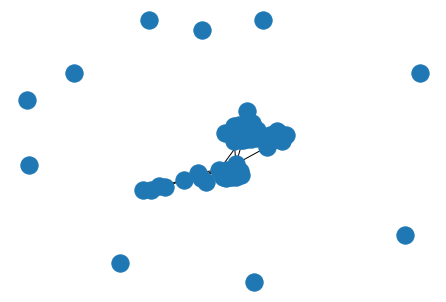

In [104]:
nx.draw(g)

In [109]:
g.number_of_edges()

579

In [110]:
Gcc = sorted(nx.connected_components(g), key=len, reverse=True)

In [114]:
G_largest = Gcc[0]

In [119]:
def select_gygantic_component(g: nx.Graph) -> nx.Graph:
    num_comp = nx.number_connected_components(g)
    el = list(sorted(nx.connected_components(g), key = len, reverse=True))[1:num_comp]
    for _ in el: 
        g.remove_nodes_from(_)
    return g

In [121]:
gg = select_gygantic_component(g)

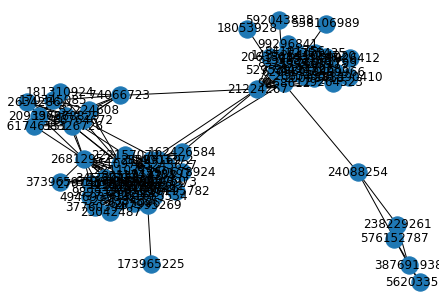

In [128]:
gg = select_gygantic_component(g)
nx.draw(gg, with_labels = True)

In [156]:
def page_rank(G, alpha, k):
    A = nx.to_numpy_array(G)
    P = transition_matrix(A)
    v = teleportation_vector(A)
    rank = np.ones(A.shape[0]) / A.shape[0]
    for _ in range(k):
        rank = update_rank(rank, P, v, alpha)
    return np.array(rank)

In [159]:
def transition_matrix(A):
    # YOUR CODE HERE
    return A/np.sum(A, axis = 1,keepdims = True )

In [158]:
A = nx.to_numpy_array(gg)

(80, 80)

In [161]:
G = nx.from_numpy_matrix(A)

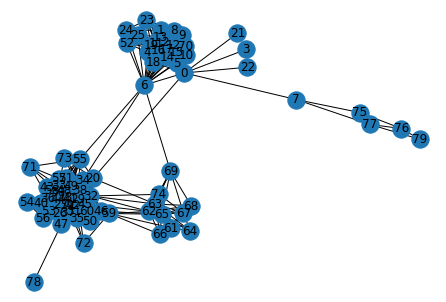

In [162]:
nx.draw(G, with_labels = True)

In [166]:
mass_id = list(gg.nodes)

In [183]:
mass_id[20]

514003372

In [160]:
def teleportation_vector(A):
    return np.ones(A.shape[0])/A.shape[0]

In [174]:
def update_rank(rank, P, v, alpha):
    return alpha*np.dot(P.T, rank)+(1-alpha)*v

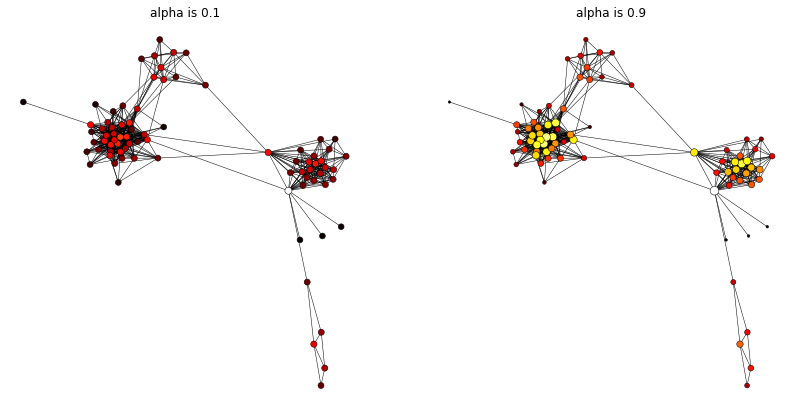

In [175]:
plt.figure(figsize=(14, 7))
pos = nx.spring_layout(G)

cases = [0.1, 0.9]

for i, alpha in enumerate(cases):
    plt.subplot(1, 2, i+1)
    PR = page_rank(gg, alpha, 10)
    nx.draw(G, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*3e3,
            node_color=PR)
    plt.title('alpha is {}'.format(alpha))

# Это граф для сестры, для меня ниже

In [184]:
def get_friends1(user_ids):
    return vk.friends.get(user_id = user_ids, count = 2000)

graph_anna = {}
fl = 0
friend_ids = get_friends1('150881425')  # ваш user id, для которого вы хотите построить граф друзей.
for friend_id in friend_ids['items']:
    print ('Processing id: ', friend_id)
    try:
        graph_anna[friend_id] = get_friends1(str(friend_id))
    except Exception:
        fl += 1

In [187]:
g_anna = nx.Graph(directed=False)

for i in graph_anna:
    g_anna.add_node(i)
    for j in graph_anna[i]['items']:
        if i != j and i in friend_ids['items'] and j in friend_ids['items']:
            g_anna.add_edge(i, j)

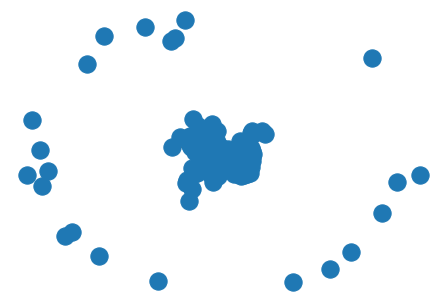

In [189]:
nx.draw(g_anna)

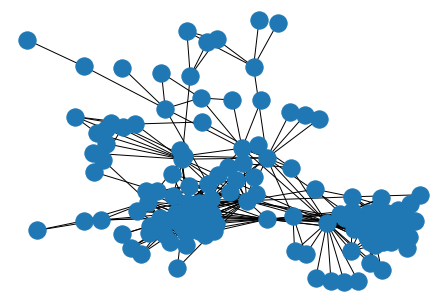

In [190]:
gg_anna = select_gygantic_component(g_anna)
nx.draw(gg_anna)

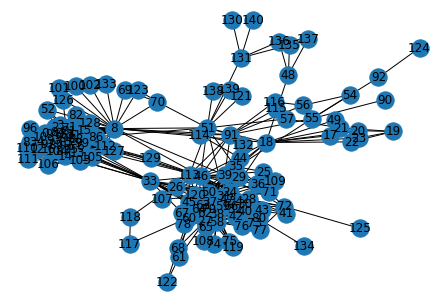

In [191]:
A_anna = nx.to_numpy_array(gg_anna)
G_anna = nx.from_numpy_matrix(A_anna)
nx.draw(G_anna, with_labels = True)

In [192]:
mass_id_anna = list(gg_anna.nodes)

In [220]:
mass_id_anna[137]

445828645

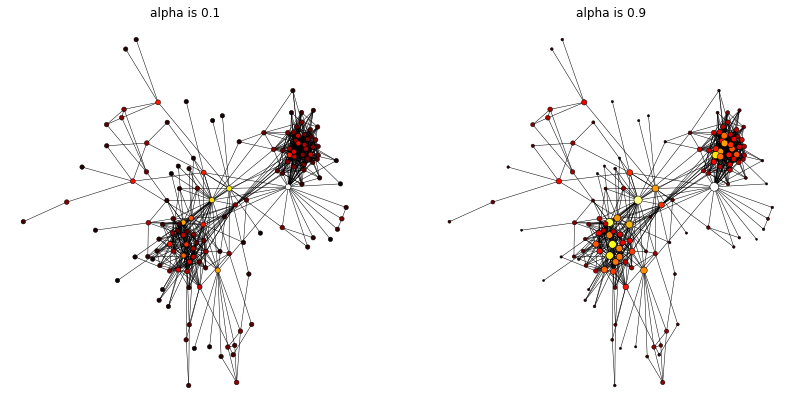

In [197]:
plt.figure(figsize=(14, 7))
pos = nx.spring_layout(G_anna)

cases = [0.1, 0.9]

for i, alpha in enumerate(cases):
    plt.subplot(1, 2, i+1)
    PR = page_rank(gg_anna, alpha, 10)
    nx.draw(G_anna, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*3e3,
            node_color=PR)
    plt.title('alpha is {}'.format(alpha))

In [203]:
np.argmax(PR)

8

In [204]:
def edge_betweenness(G, n):

    Gcopy = G.copy()

    curr_cc_count = nx.number_connected_components(Gcopy)

    result = []

    while curr_cc_count <= n:

        edge_btw = nx.edge_betweenness_centrality(Gcopy)

        cut_edge = sorted(edge_btw.keys(), key=lambda x : edge_btw[x])[-1]

        Gcopy.remove_edge(*cut_edge)

        if (nx.number_connected_components(Gcopy) > curr_cc_count):

            iter_result = np.zeros((Gcopy.number_of_nodes()))

            for idx, cc in enumerate(nx.connected_components(Gcopy)):

                iter_result[np.isin(G.nodes, list(cc))] = idx

            result.append(iter_result)

            curr_cc_count += 1

    return np.array(result)

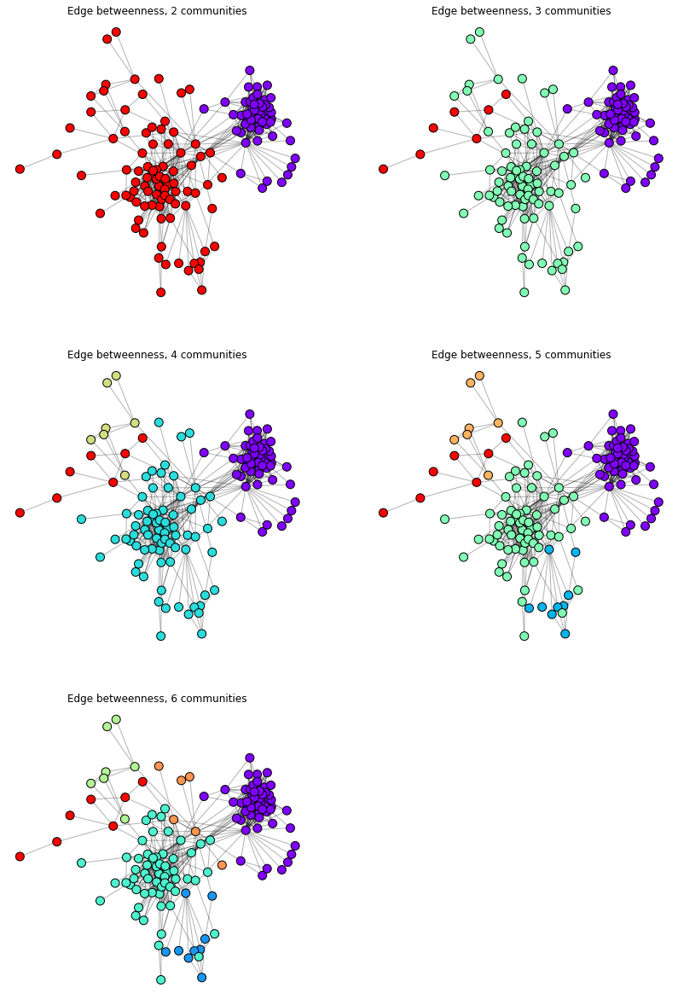

In [205]:
plt.figure(figsize=(7*2, 7*3))

colors = edge_betweenness(G_anna, 5)

for i in range(colors.shape[0]):

    plt.subplot(3, 2, i+1)

    nx.draw_networkx_nodes(

        G_anna, 

        pos,к

        cmap=plt.cm.rainbow,

        node_color=colors[i], 

        node_size=100, 

        edgecolors='black'

    )

    nx.draw_networkx_edges(G_anna, pos, alpha=0.3)

    plt.title('Edge betweenness, {} communities'.format(i+2))

    plt.axis('off')

# Граф для меня

In [856]:
def get_friends1(user_ids):
    return vk.friends.get(user_id = user_ids,  count = 2000, fields='sex, city')

graph_alex = {}
fl = 0
cur = 0
friend_ids = get_friends1('9268612')  # ваш user id, для которого вы хотите построить граф друзей.
for friend_id in friend_ids['items']:
    fl += 1
    print(fl)
    try:
        graph_alex[friend_id['id']] = get_friends1(str(friend_id['id']))
    except Exception:
        cur = 0
        

In [851]:
struc = vk.friends.get(user_id = '9268612',  count = 2000, fields = 'nickname, sex, city')

In [560]:
g_alex = nx.Graph(directed=False)

for i in graph_alex:
    g_alex.add_node(i)
    for j in graph_alex[i]['items']:
        if i != j and i in friend_ids['items'] and j in friend_ids['items']:
            g_alex.add_edge(i, j)

Количество 

In [561]:
len(g_alex.nodes())

1190

In [535]:
len(gg_alex.edges())

5667

In [292]:
nx.diameter(gg_alex)

10

In [293]:
nx.radius(gg_alex)

6

Распределение степеней + MLE.

Text(0.5, 1.0, 'Degree histogram of biggest component')

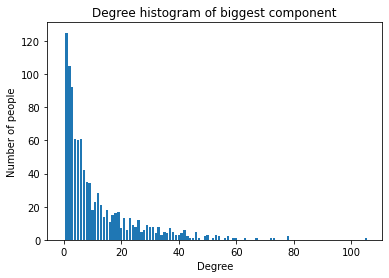

In [526]:
degree_hist = nx.degree_histogram(gg_alex) 
plt.bar(range(len(degree_hist)), degree_hist);
plt.xlabel('Degree')
plt.ylabel('Number of people')
plt.title("Degree histogram of biggest component")

In [782]:
def power_law_pdf(x, alpha=3.5, x_min=1):
    C = (alpha - 1) / x_min ** (1 - alpha)
    return C * x ** (-alpha)

In [783]:
x_space = np.linspace(1, 100, 300)

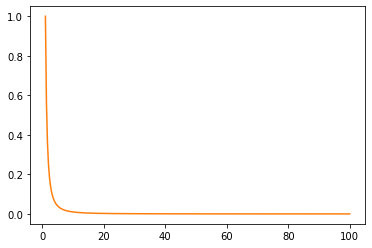

In [786]:
plt.plot(x_space, power_law_pdf(x_space, alpha = 2, x_min = 1), 
         label='Theoretical PDF', c='tab:orange')

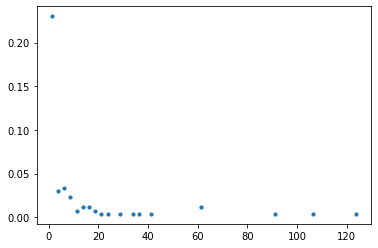

In [790]:
hist, bin_edges = np.histogram(degree_hist, bins=50, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
plt.scatter(bin_centers[hist > 0], hist[hist > 0], s=10)

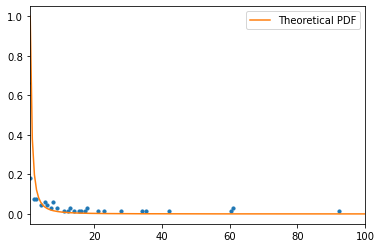

In [820]:
hist, bin_edges = np.histogram(degree_hist, bins=200, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
plt.scatter(bin_centers[hist > 0], hist[hist > 0], s=10)
plt.plot(x_space, power_law_pdf(x_space, alpha=2, x_min=1), 
         label='Theoretical PDF', c='tab:orange')
plt.legend()
plt.xlim(1, 100)
plt.show()


Распределение степеней похоже на power-law distribtuion.

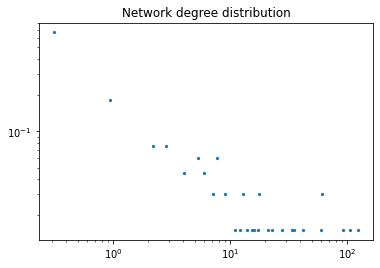

In [811]:
hist, bin_edges = np.histogram(degree_hist, bins=200, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
plt.scatter(bin_centers[hist > 0], hist[hist > 0], s=5)
plt.title('Network degree distribution')
plt.xscale('log')
plt.yscale('log')

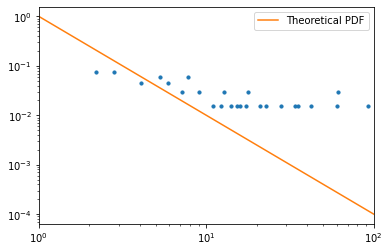

In [812]:
hist, bin_edges = np.histogram(degree_hist, bins=200, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
plt.scatter(bin_centers, hist, s=10)
plt.plot(x_space, power_law_pdf(x_space, alpha=2, x_min=1), 
         label='Theoretical PDF', c='tab:orange')
plt.legend()
plt.xscale('log')
plt.yscale('log')
plt.xlim(1, 100)
plt.show()

In [780]:
from sklearn.linear_model import LinearRegression
def alpha_lin_bins(x_train, bins):
    hist, bin_edges = np.histogram(x_train, bins)
    
    bin_centers = np.log((bin_edges[1:] + bin_edges[:-1]) / 2)
    bin_centers = bin_centers[hist > 0].reshape(-1, 1)
    
    regression = LinearRegression()
    regression.fit(bin_centers, np.log(hist[hist>0]))
    return abs(regression.coef_[-1])

In [813]:
alpha_lin_bins(degree_hist, 200)

0.5733449349123658

In [528]:
nx.average_clustering(gg_alex)

0.380452798390147

In [529]:
nx.average_clustering(gg_alex)
nx.average_shortest_path_length(gg_alex)

4.312003219016962

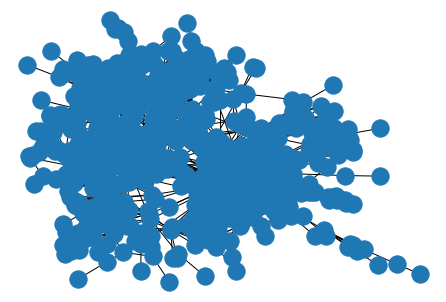

In [225]:
gg_alex = select_gygantic_component(g_alex)
nx.draw(gg_alex)

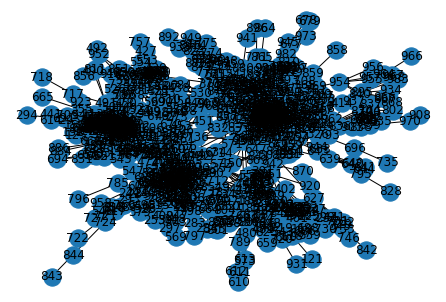

In [226]:
A_alex = nx.to_numpy_array(gg_alex)
G_alex = nx.from_numpy_matrix(A_alex)
nx.draw(G_alex, with_labels = True)

In [228]:
mass_id_alex = list(gg_alex.nodes)


In [241]:
mass_id_alex[23]

45695473

In [230]:
PR = page_rank(gg_alex, 0.3, 10)
np.argsort(PR)

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
G_test = nx.cycle_graph(80)
pos = nx.circular_layout(G)
# default
plt.figure(1)
nx.draw(G,pos)
# smaller nodes and fonts
plt.figure(2)
nx.draw(G,pos,node_size=60,font_size=8) 
# larger figure size
plt.figure(3,figsize=(12,12)) 
nx.draw(G,pos)
plt.show()

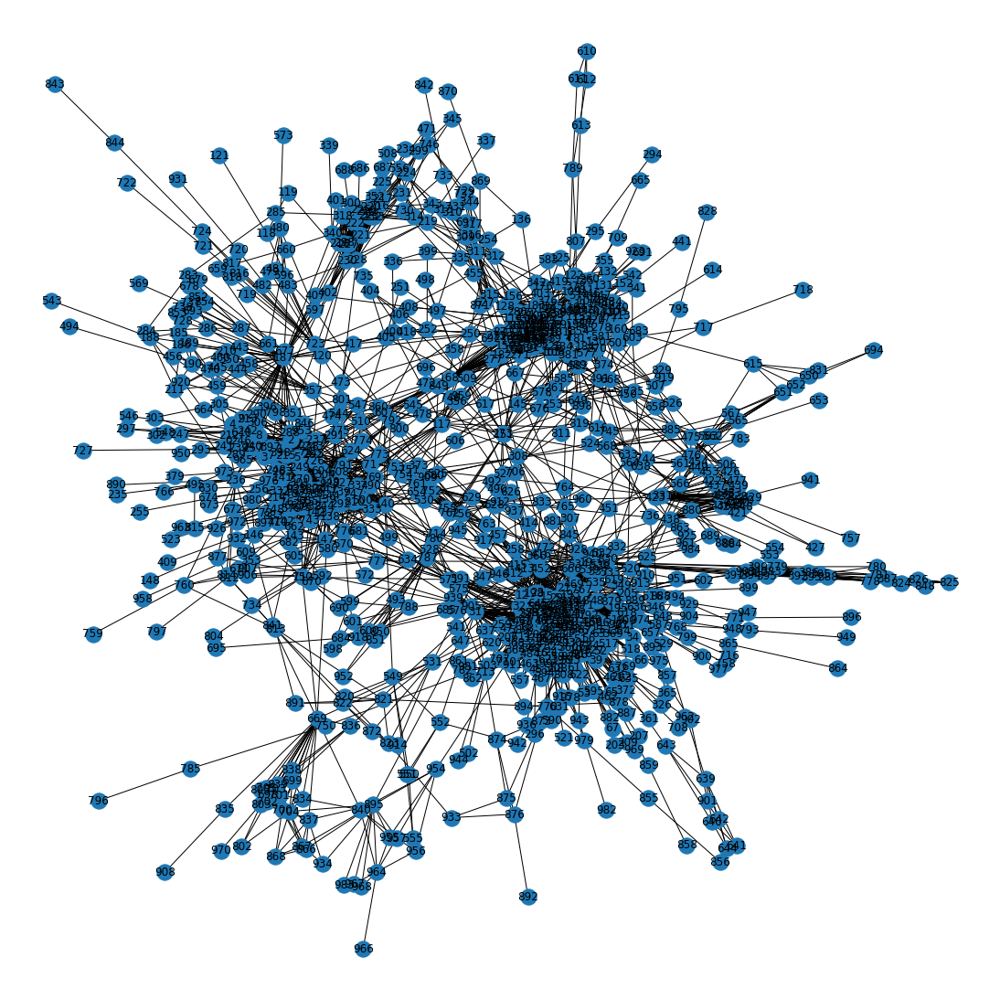

In [248]:
plt.figure(3,figsize=(15,15)) 
nx.draw(G_alex, with_labels = True)
plt.show()

In [333]:
mass_id_alex[83]

4645841

In [279]:
from IPython.display import SVG

In [282]:
me = vk.users.get(user_id = '9268612',fields = 'nickname') 

In [297]:
layout = nx.kamada_kawai_layout(G_alex)

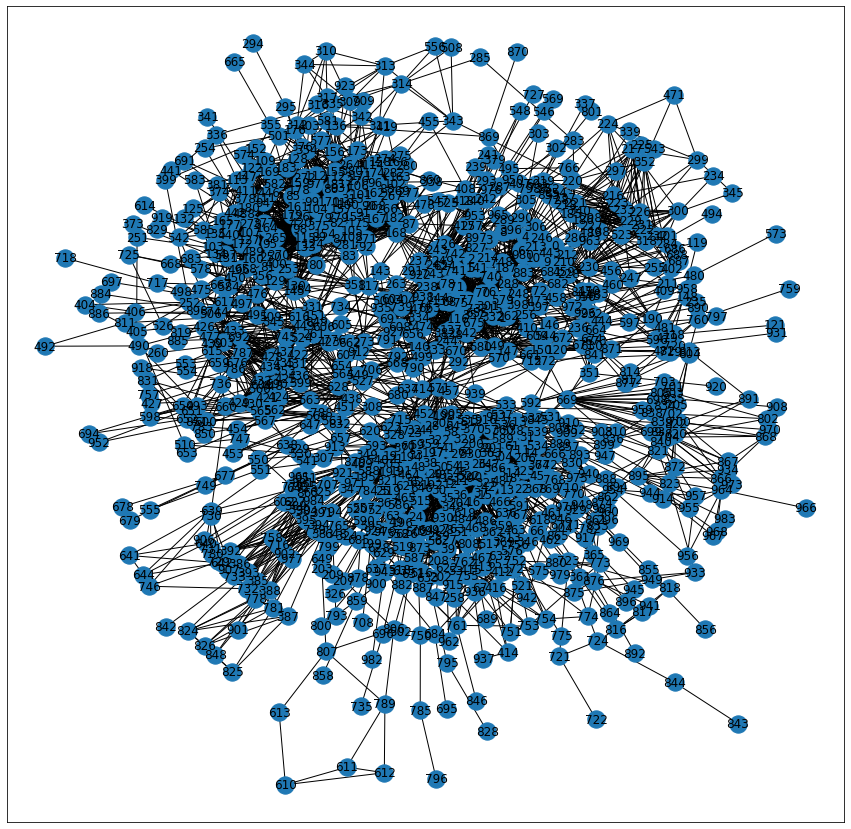

In [302]:
plt.figure(3,figsize=(15,15)) 
nx.draw_networkx(G_alex, layout)
plt.show()

In [320]:
def drawing_nodes_params(graph, layout):
    d = {}
    d['G'] = graph
    d['pos'] = layout
    cur = []
    node_size = []
    for key, val in layout.items():
        
        node_size.append(graph.degree[key]**2+10)
        
    d['node_size'] = np.array(node_size)
    
    
    return d

In [321]:

params = drawing_nodes_params(G_alex, layout)

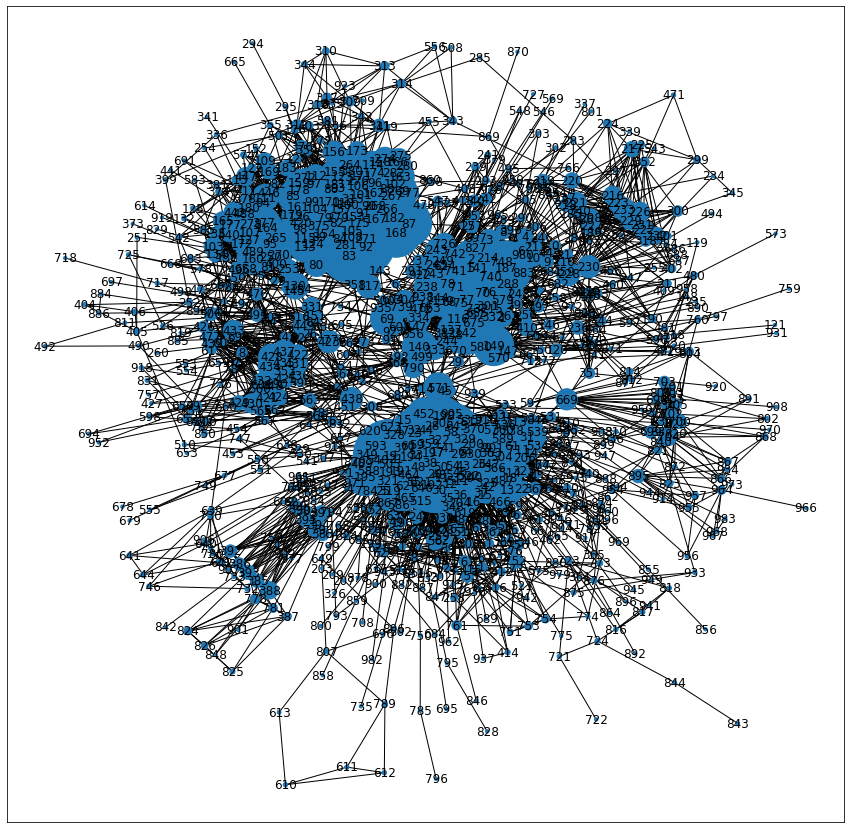

In [322]:
plt.figure(3,figsize=(15,15)) 
nx.draw_networkx(G_alex, pos = layout,node_size = params['node_size'])
plt.show()

In [323]:
def labels_list_parameters(graph, layout):
    
    degrees = []
    for key, val in layout.items():
        if (graph.degree[key] >= 6):
            degrees.append(graph.degree[key])
    degrees = list(set(degrees))
    #for key, val in layout.items():
    #        layout[key][1] = val[1] - 0.025*math.sqrt(matrixG.degree[key])  # сдвиг на y = y - 0.025*sqrt(degree)
    ans = []
    for i in range(len(degrees)):
        
        d = {}
        d['G'] = graph
        d['pos'] = layout
        all_keys = []
        
        for key, val in layout.items():
            if (graph.degree[key] == degrees[i]):
            
                d['font_size'] = graph.degree[key]
                all_keys.append(key)
        all_ = {}
        for el in all_keys:
            all_[el] = el
            
        d['labels'] = all_
    
        ans.append(d)
    
    return ans

In [326]:
labels = labels_list_parameters(G_alex, layout)

In [353]:
PR = page_rank(gg_alex, 0.8, 10)
mass_page = np.argsort(PR)
mass_page = mass_page[::-1]

In [519]:
page_friends = []
for i in range(10):
    struc = vk.users.get(user_id = mass_id_alex[mass_page[i]],fields = 'nickname')[0]
    page_friends.append( struc['first_name'] + ' ' +  struc['last_name'])

In [520]:
page_fri ends

['Алёна Морозова',
 'Миша Абрамов',
 'Дмитрий Филев',
 'Иван Веселов',
 'Алексей Бабич',
 'Дмитрий Плотников',
 'Сергей Коваленко',
 'Никита Край',
 'Максим Федоров',
 'Мария Дандыль']

Тут считают pagerank с другим параметром.

In [555]:
PR = page_rank(gg_alex, 0.1, 10)
mass_page = np.argsort(PR)
mass_page = mass_page[::-1]
page_friends_new = []
for i in range(10):
    struc = vk.users.get(user_id = mass_id_alex[mass_page[i]],fields = 'nickname')[0]
    page_friends_new.append( struc['first_name'] + ' ' +  struc['last_name'])

In [556]:
page_friends_new

['Миша Абрамов',
 'Иван Веселов',
 'Дмитрий Филев',
 'Алёна Морозова',
 'Дмитрий Плотников',
 'Никита Край',
 'Дмитрий Аудитор',
 'Алексей Бабич',
 'Мария Дандыль',
 'Николай Воинов']

In [825]:
def hits_polblogs(graph):
    digraph = nx.DiGraph(graph)
    h, a  = nx.hits(digraph)
    return (digraph, h, a)

In [826]:
h, a = nx.hits(new_alex)

PowerIterationFailedConvergence: (PowerIterationFailedConvergence(...), 'power iteration failed to converge within 100 iterations')

nx.hits has failed to converge.

Closeness centrality.

In [358]:
d_closeness = nx.closeness_centrality(G_alex)
sorted_x = sorted(d_closeness.items(), key=operator.itemgetter(1))

In [369]:
close_friends = []
for i in range(10):
    cur = len(sorted_x)-1-i
    struc = vk.users.get(user_id = mass_id_alex[sorted_x[cur][0]],fields = 'nickname')[0]
    close_friends.append( struc['first_name'] + ' ' +  struc['last_name'])
    

In [370]:
close_friends

['Алёна Морозова',
 'Миша Абрамов',
 'Никита Край',
 'Ирина Чумиканова',
 'Анюта Андрианова',
 'Дмитрий Филев',
 'Костя Вышка',
 'Андрей Летита',
 'Евгений Малахов',
 'Сергей Сергеев']

Betweenness centrality.

In [371]:
btw_friends = []

In [362]:
d_betweenness = nx.betweenness_centrality(G_alex)

In [372]:
d_betweenness = nx.betweenness_centrality(G_alex)
sorted_x_btw = sorted(d_betweenness.items(), key=operator.itemgetter(1))
for i in range(10):
    cur = len(sorted_x_btw)-1-i
    struc = vk.users.get(user_id = mass_id_alex[sorted_x_btw[cur][0]],fields = 'nickname')[0]
    btw_friends.append( struc['first_name'] + ' ' +  struc['last_name'])

In [373]:
btw_friends

['Миша Абрамов',
 'Никита Край',
 'Иван Веселов',
 'Алёна Морозова',
 'Дмитрий Филев',
 'Ирина Чумиканова',
 'Иван Савчук',
 'Анюта Андрианова',
 'Damir Sharafetdinov',
 'Игорь Папуашвили']

Degree centrality. 

In [536]:
degree_friends = []
degree_cent = nx.degree_centrality(G_alex)

In [538]:
sorted_degree = sorted(degree_cent.items(), key=operator.itemgetter(1))
for i in range(10):
    cur = len(sorted_degree)-1-i
    struc = vk.users.get(user_id = mass_id_alex[sorted_degree[cur][0]],fields = 'nickname')[0]
    degree_friends.append( struc['first_name'] + ' ' +  struc['last_name'])

In [539]:
degree_friends

['Алёна Морозова',
 'Сергей Коваленко',
 'Алексей Бабич',
 'Миша Абрамов',
 'Дмитрий Филев',
 'Михаль Розенвальд',
 'Максим Шуранков',
 'Виктор Яковлев',
 'Евгений Мостовой',
 'Павел Воропаев']

In [ ]:
degree_cent = nx.degree_centrality(G)

In [540]:
datafr  = {'Pagerank': page_friends, 'Closeness':close_friends, 'Betweenness':btw_friends, 'Degree':degree_friends}


In [541]:
datafr  = {'Pagerank': page_friends, 'Closeness':close_friends, 'Betweenness':btw_friends, 'Degree':degree_friends}
df = pd.DataFrame(data=datafr)

Final table of all centralities.

In [542]:
df

,Pagerank,Closeness,Betweenness,Degree
0,Алёна Морозова,Алёна Морозова,Миша Абрамов,Алёна Морозова
1,Миша Абрамов,Миша Абрамов,Никита Край,Сергей Коваленко
2,Дмитрий Филев,Никита Край,Иван Веселов,Алексей Бабич
3,Иван Веселов,Ирина Чумиканова,Алёна Морозова,Миша Абрамов
4,Алексей Бабич,Анюта Андрианова,Дмитрий Филев,Дмитрий Филев
5,Дмитрий Плотников,Дмитрий Филев,Ирина Чумиканова,Михаль Розенвальд
6,Сергей Коваленко,Костя Вышка,Иван Савчук,Максим Шуранков
7,Никита Край,Андрей Летита,Анюта Андрианова,Виктор Яковлев
8,Максим Федоров,Евгений Малахов,Damir Sharafetdinov,Евгений Мостовой
9,Мария Дандыль,Сергей Сергеев,Игорь Папуашвили,Павел Воропаев


In [378]:
from networkx.algorithms.approximation import clique

Maximal clique.

In [379]:
cliq = nx.make_clique_bipartite(g_alex)

In [394]:
cligs = nx.find_cliques(g_alex)

In [395]:
el  = list(cligs)

In [406]:
f = 0
ans = []
for elem in el:
    if len(elem) > f:
        f = len(elem)
        ans = elem


In [408]:
num_cliq = {}
for elem in el:
    try:
        num_cliq[len(elem)] += 1
    except Exception:
        num_cliq[len(elem)] = 1

In [409]:
num_cliq

{4: 624,
 5: 823,
 2: 508,
 3: 544,
 6: 762,
 7: 576,
 9: 173,
 8: 316,
 10: 91,
 11: 62,
 12: 45,
 14: 25,
 13: 20,
 15: 5,
 16: 2}

Видно, что две самые большие клики обнаружены. Посмотрим внимательно. 

In [421]:
f = 0
ans_max = []
for elem in el:
    if len(elem) == 16:
        ans_max.append(elem)

In [543]:
ans

[170100773,
 14037678,
 13645527,
 4717072,
 119614100,
 35347263,
 32034354,
 53042438,
 54729658,
 22862722,
 20009838,
 13281713,
 11041200,
 12518218,
 53917004,
 30612805]

In [647]:
guys_clique = []
fl = 0
for i in ans:
    struc = vk.users.get(user_id = i,fields = 'nickname')[0]
    fl += 1
    if (fl == 7):
        continue
    print( struc['first_name'] + ' ' +  struc['last_name'])
    
    guys_clique.append(struc['first_name'] + ' ' +  struc['last_name'])

Артур Чахвадзе
Максим Шуранков
Павел Воропаев
Михаль Розенвальд
Илья Соловьев
Даниил Ваньков
Сергей Скородумов
Роман Лучков
Иван Казанский
Дарья Вальтер
Рената Гилл
Лиза Свитанько
Ярослав Сергиенко
Андрей Сон
Анна Титова


In [552]:
datafr_clique  = {'Max clique': guys_clique}
df1 = pd.DataFrame(data = datafr_clique)
df1

,Max clique
0,Артур Чахвадзе
1,Максим Шуранков
2,Павел Воропаев
3,Михаль Розенвальд
4,Илья Соловьев
5,Даниил Ваньков
6,Сергей Скородумов
7,Роман Лучков
8,Иван Казанский
9,Дарья Вальтер


In [550]:
df1.drop([6])
df1

,Max clique
0,Артур Чахвадзе
1,Максим Шуранков
2,Павел Воропаев
3,Михаль Розенвальд
4,Илья Соловьев
5,Даниил Ваньков
6,DELETED
7,Сергей Скородумов
8,Роман Лучков
9,Иван Казанский


Это одногруппники из универа с бакалавриата.

In [ ]:
def select_gygantic_component(g: nx.Graph) -> nx.Graph:
    num_comp = nx.number_connected_components(g)
    el = list(sorted(nx.connected_components(g), key = len, reverse=True))[1:num_comp]
    for _ in el: 
        g.remove_nodes_from(_)
    return g

Чтоб график был лучше удалю врешины, у которых degree < 3. 

In [442]:
new_alex = g_alex.copy()

In [443]:
fl = 0
for el in g_alex.degree():
    if (el[1] < 4):
        new_alex.remove_node(el[0])

In [444]:
len(new_alex.nodes())

663

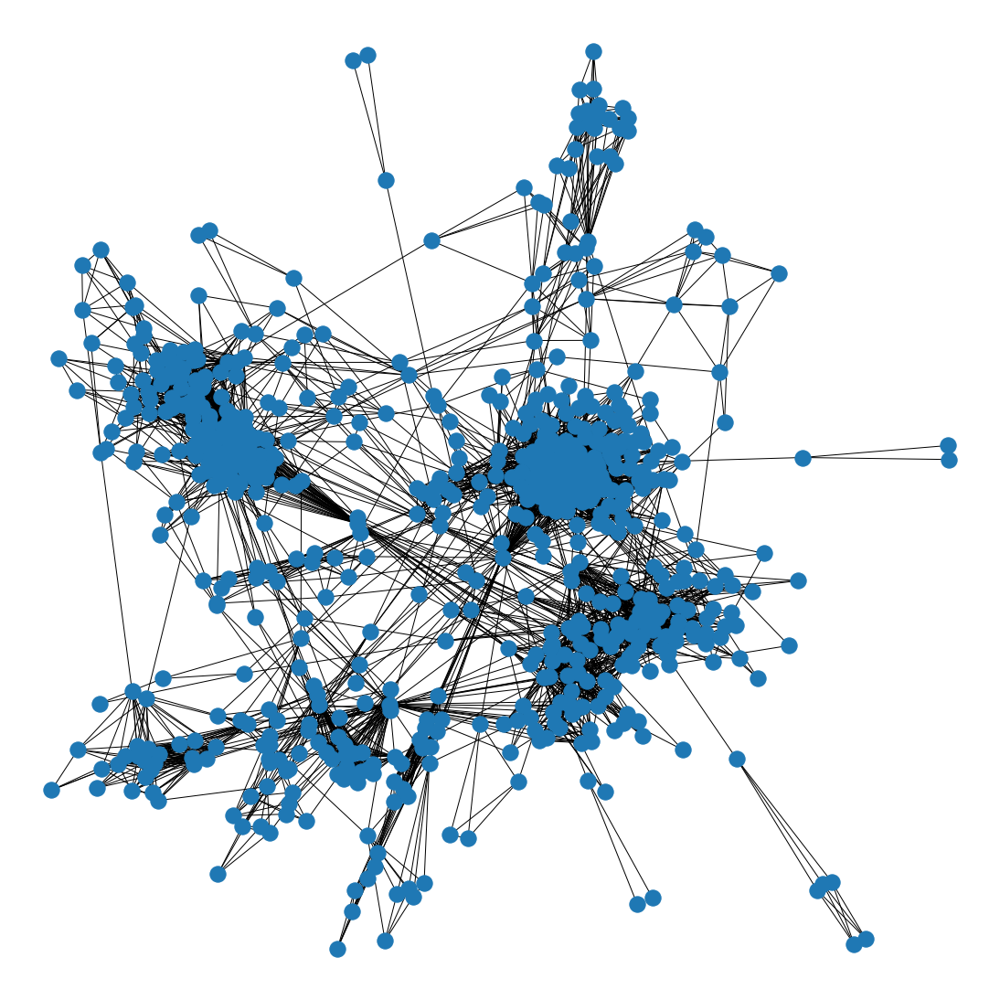

In [672]:
plt.figure(3,figsize=(15,15)) 
nx.draw(new_alex)
plt.show()

In [446]:
layout_new = nx.kamada_kawai_layout(new_alex)
params_new = drawing_nodes_params(new_alex, layout_new)

In [449]:
PR_new = page_rank(gg_alex, 0.8, 10)
mass_page_new = np.argsort(PR_new)

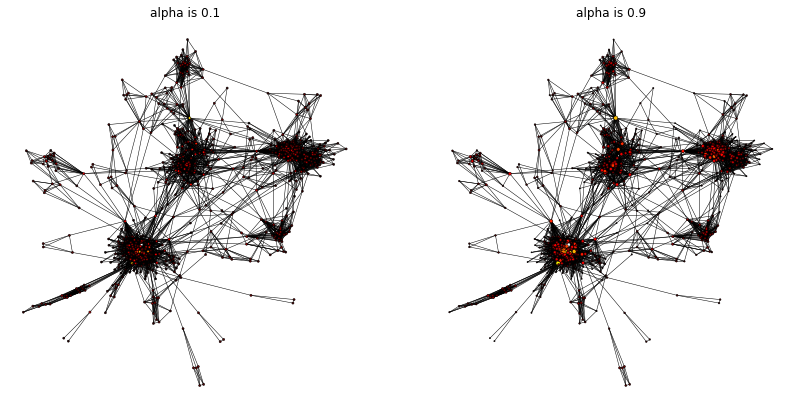

In [465]:
plt.figure(figsize=(14, 7))
pos = nx.spring_layout(new_alex)

cases = [0.1, 0.9]

for i, alpha in enumerate(cases):
    plt.subplot(1, 2, i+1)
    PR = page_rank(new_alex, alpha, 10)
    nx.draw(new_alex, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*3e3,
            node_color=PR)
    plt.title('alpha is {}'.format(alpha))

In [675]:
A = nx.to_numpy_array(new_alex)
New_alexey = nx.from_numpy_matrix(A)
mass_id_alexey = list(new_alex.nodes)

In [880]:
mass_id_alexey[178]

123543767

In [691]:
pos1 = nx.spring_layout(gg_alex)

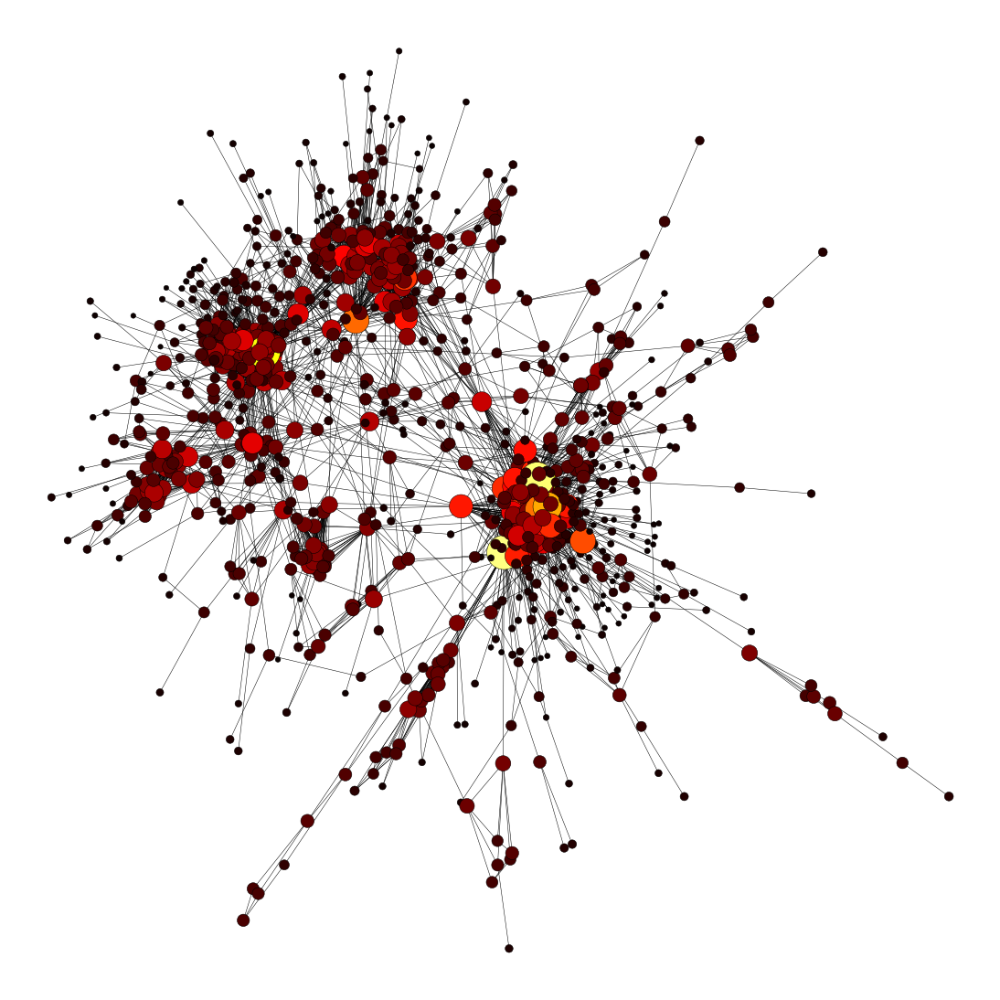

In [693]:
plt.figure(figsize=(15, 15))
PR = page_rank(gg_alex, 0.9, 10)
nx.draw(gg_alex, 
            pos1,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*200000,
            node_color=PR)

In [ ]:
pos = nx.spring_layout(New_alexey)

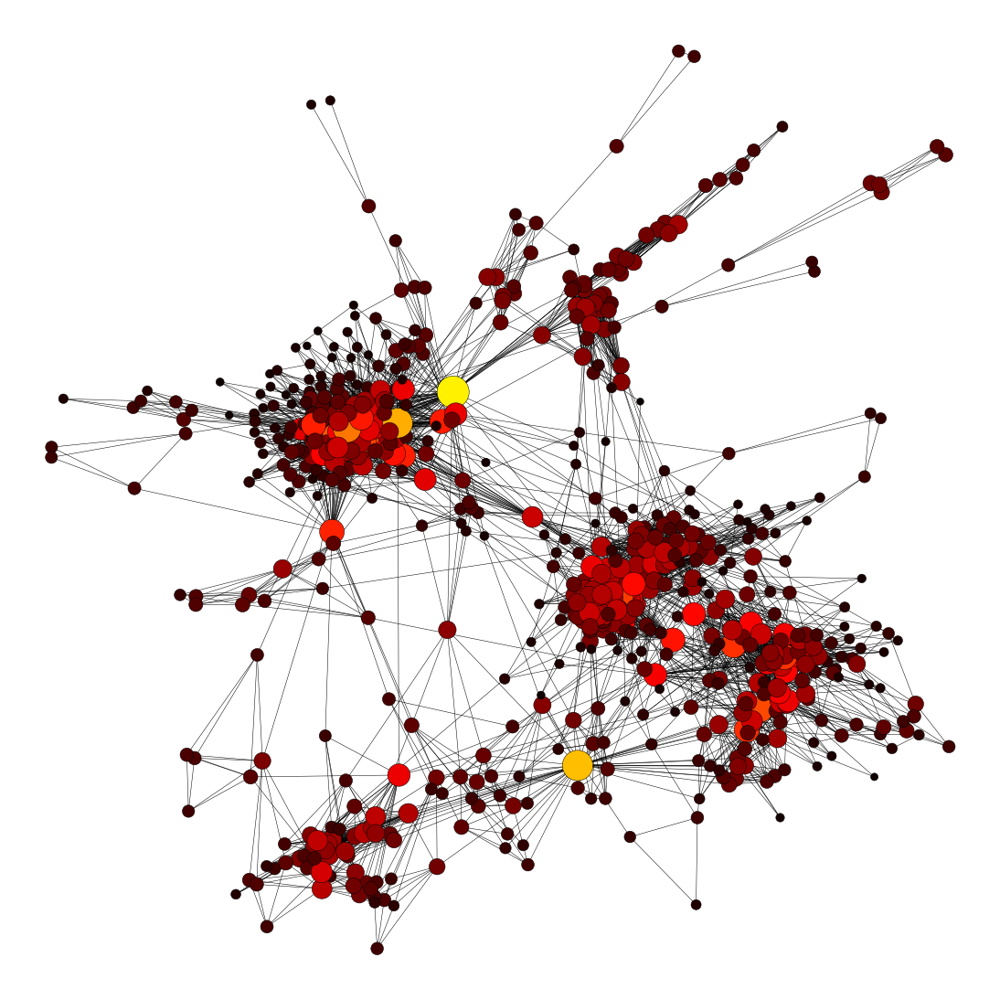

In [705]:
plt.figure(figsize=(15, 15))
PR = page_rank(New_alexey, 0.9, 10)
nx.draw(New_alexey, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*200000,
            node_color=PR, with_labels = True)

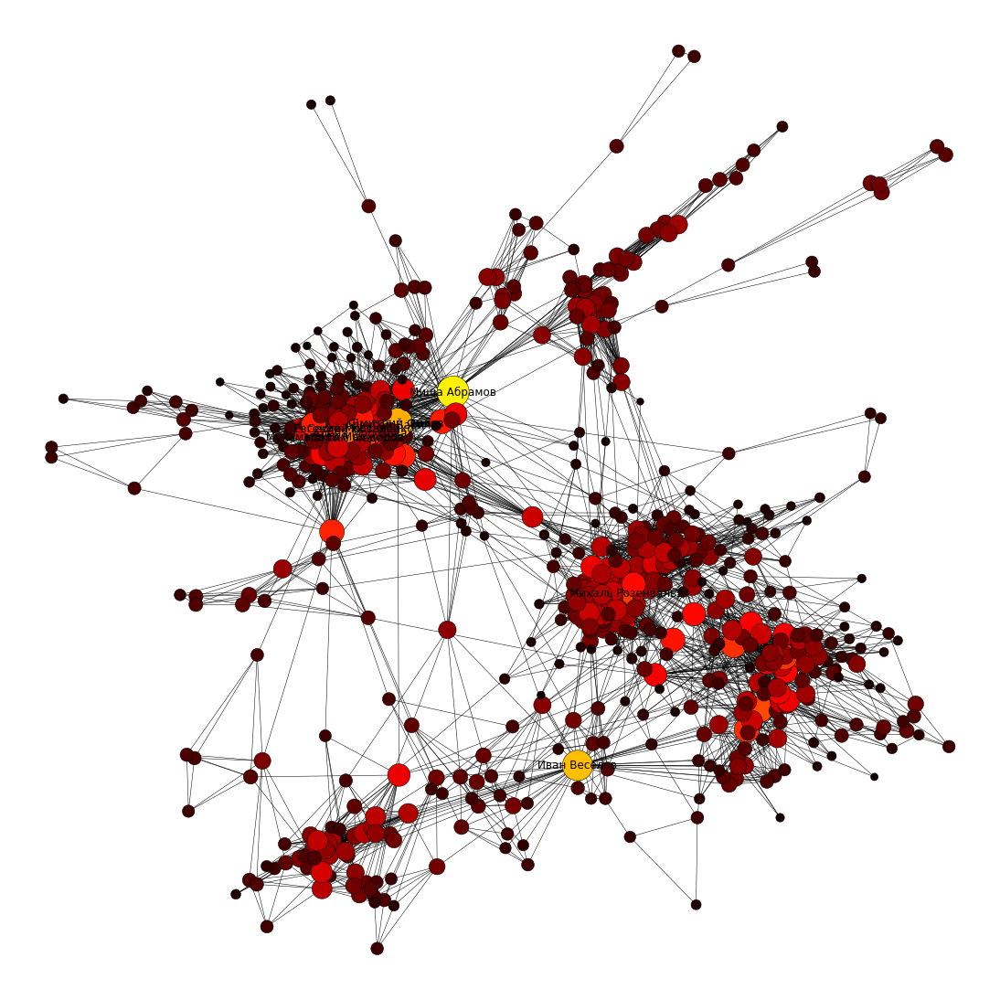

In [885]:
plt.figure(figsize=(15, 15))
#PR = page_rank(New_alexey, 0.9, 10)
nx.draw(New_alexey, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*200000,
            node_color=PR, labels=lab)

Visualisation of top-nodes.

In [893]:
color_map = []
for node in New_alexey:
    if node in arg:
        color_map.append('yellow')
    else: 
        color_map.append('none') 
    

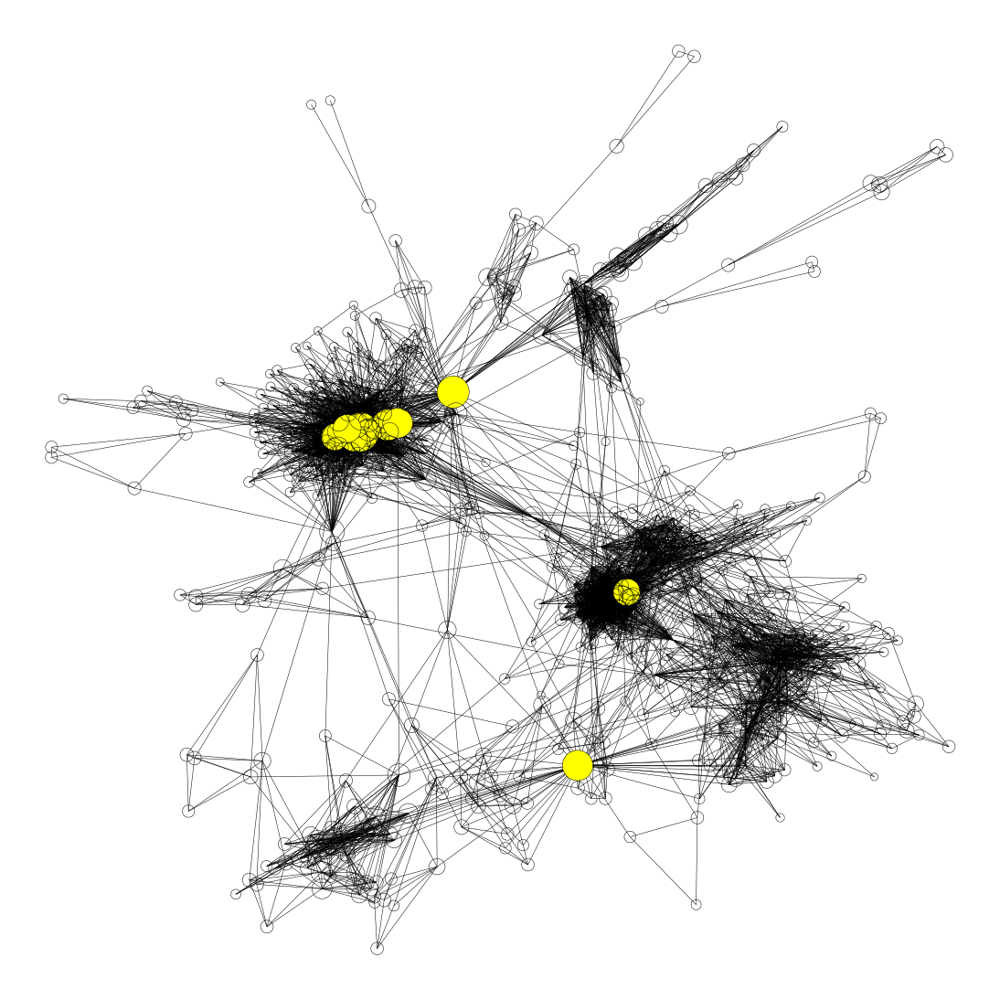

In [894]:
plt.figure(figsize=(15, 15))
#PR = page_rank(New_alexey, 0.9, 10)
nx.draw(New_alexey, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*200000,
            node_color=color_map)

In [906]:
arg_btw

array([ 19, 149, 187,  17, 347, 198,  31, 452, 669, 140])

In [901]:
arg_btw = np.array([el[0] for el in sorted_x_btw[::-1][:10]])

In [902]:
arg_closeness = np.array([el[0] for el in sorted_x[::-1][:10]])

In [903]:
arg_degree = np.array([el[0] for el in sorted_degree[::-1][:10]])

In [878]:
arg = np.argsort(PR)[::-1][:10]

In [881]:
lab = {}
for el in arg:
         struc = vk.users.get(user_id = mass_id_alexey[el],fields = 'nickname')[0]
         lab[el] =  struc['first_name'] + ' ' +  struc['last_name']
    

In [882]:
lab

{17: 'Алёна Морозова',
 38: 'Сергей Коваленко',
 19: 'Миша Абрамов',
 20: 'Алексей Бабич',
 178: 'Иван Веселов',
 310: 'Дмитрий Филев',
 422: 'Евгений Мостовой',
 80: 'Михаль Розенвальд',
 50: 'Максим Федоров',
 53: 'Мухамадали Маджидов'}

In [907]:
btw_friends_new = []
d_betweenness_new = nx.betweenness_centrality(New_alexey)
sorted_x_btw_new = sorted(d_betweenness_new.items(), key=operator.itemgetter(1))
for i in range(10):
    cur = len(sorted_x_btw_new)-1-i
    struc = vk.users.get(user_id = mass_id_alexey[sorted_x_btw_new[cur][0]],fields = 'nickname')[0]
    btw_friends_new.append( struc['first_name'] + ' ' +  struc['last_name'])

In [909]:
arg_btw = np.array([el[0] for el in sorted_x_btw_new[::-1][:10]])

In [910]:
color_map_btw = []
for node in New_alexey:
    if node in arg_btw:
        color_map_btw.append('yellow')
    else: 
        color_map_btw.append('none') 
    

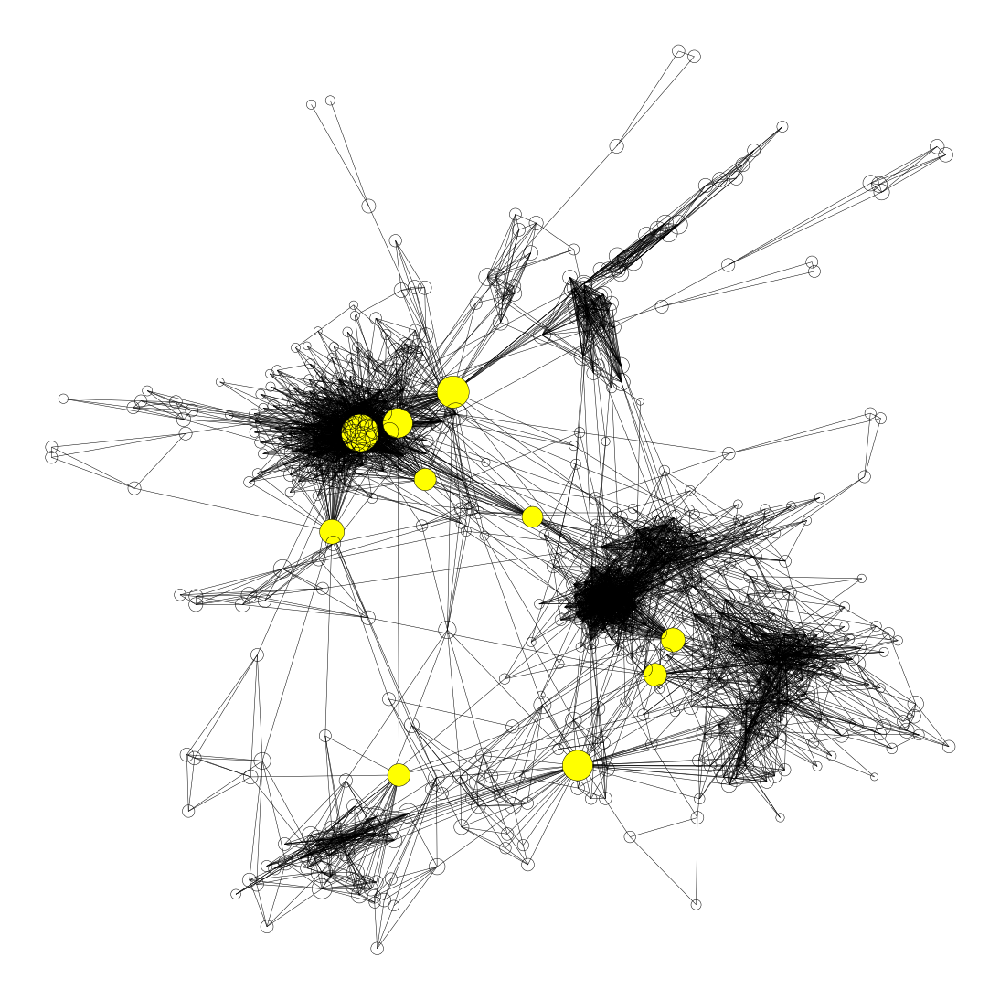

In [911]:
plt.figure(figsize=(15, 15))

nx.draw(New_alexey, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*200000,
            node_color=color_map_btw)

In [912]:
close_friends_new = []
d_close_new = nx.closeness_centrality(New_alexey)
sorted_x_close = sorted(d_close_new.items(), key=operator.itemgetter(1))
for i in range(10):
    cur = len(sorted_x_close)-1-i
    struc = vk.users.get(user_id = mass_id_alexey[sorted_x_close[cur][0]],fields = 'nickname')[0]
    close_friends_new.append( struc['first_name'] + ' ' +  struc['last_name'])

In [917]:
close_friends_new

['Никита Край',
 'Алёна Морозова',
 'Дмитрий Авдеев',
 'Андрей Летита',
 'Миша Абрамов',
 'Игорь Папуашвили',
 'Ирина Чумиканова',
 'Дмитрий Трубников',
 'Иван Эпов',
 'Анюта Андрианова']

In [914]:
arg_closeness = np.array([el[0] for el in sorted_x_close[::-1][:10]])

In [918]:
color_map_close = []
for node in New_alexey:
    if node in arg_closeness:
        color_map_close.append('yellow')
    else: 
        color_map_close.append('none') 
    

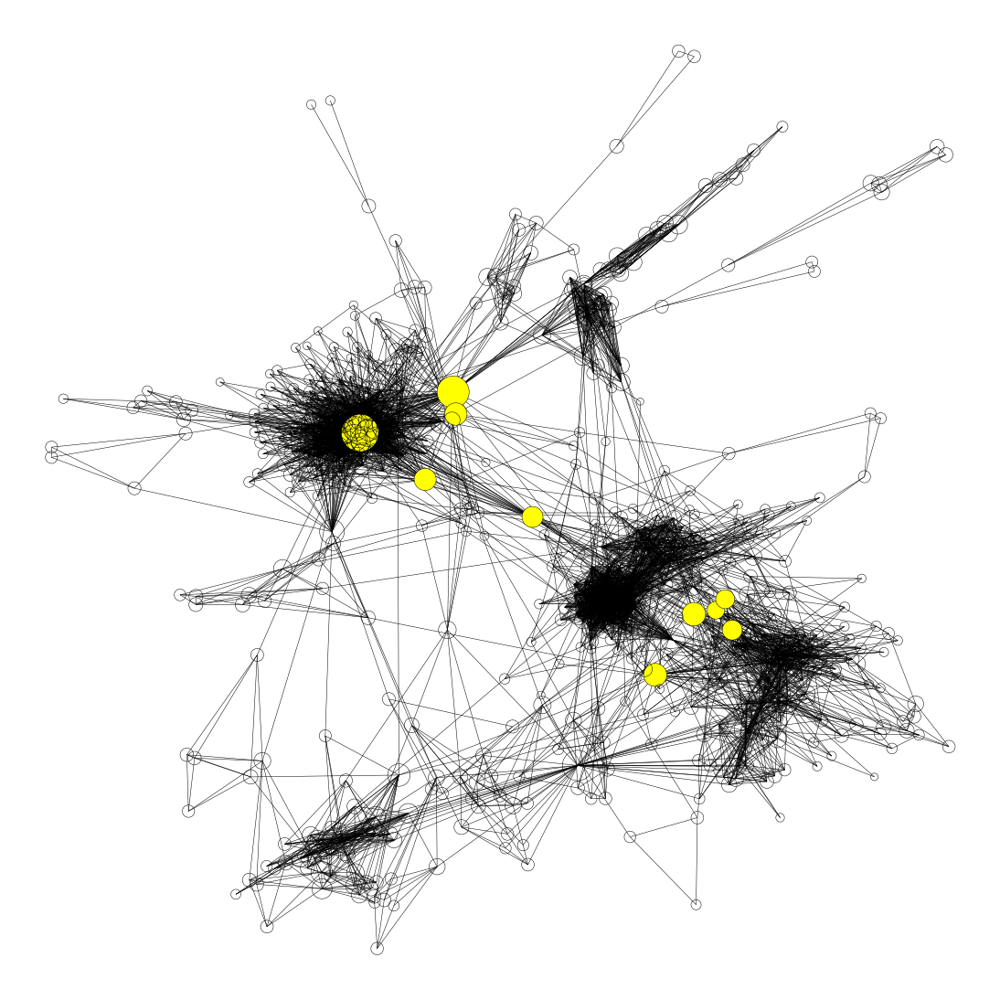

In [919]:
plt.figure(figsize=(15, 15))

nx.draw(New_alexey, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*200000,
            node_color=color_map_close)

In [920]:
degree_friends_new = []
d_degree_new = nx.degree_centrality(New_alexey)
sorted_x_degree = sorted(d_degree_new.items(), key=operator.itemgetter(1))
for i in range(10):
    cur = len(sorted_x_degree)-1-i
    struc = vk.users.get(user_id = mass_id_alexey[sorted_x_degree[cur][0]],fields = 'nickname')[0]
    degree_friends_new.append( struc['first_name'] + ' ' +  struc['last_name'])

In [925]:
degree_friends_new

['Алёна Морозова',
 'Сергей Коваленко',
 'Алексей Бабич',
 'Михаль Розенвальд',
 'Максим Шуранков',
 'Виктор Яковлев',
 'Миша Абрамов',
 'Евгений Мостовой',
 'Дмитрий Филев',
 'Павел Воропаев']

In [922]:
arg_degree = np.array([el[0] for el in sorted_x_degree[::-1][:10]])

In [923]:
color_map_degree = []
for node in New_alexey:
    if node in arg_degree:
        color_map_degree.append('yellow')
    else: 
        color_map_degree.append('none') 
    

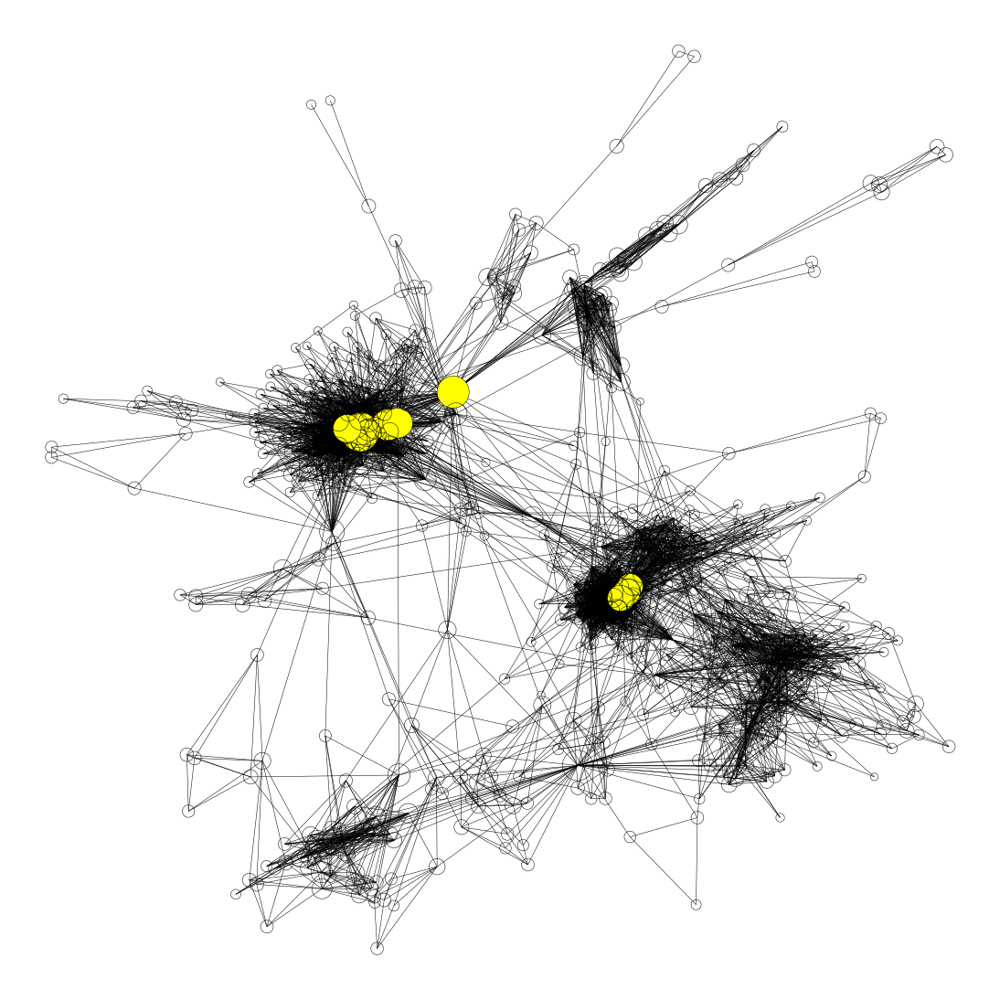

In [924]:
plt.figure(figsize=(15, 15))

nx.draw(New_alexey, 
            pos,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=PR*200000,
            node_color=color_map_degree)

In [569]:
import random as ra
import math

In [557]:
def erdos_renyi_graph(n, p):

    G = nx.Graph()

    nodes = np.arange(n)

    G.add_nodes_from(nodes)

    G.add_edges_from(random_edges(nodes, p))

    return G

In [565]:
def random_edges(nodes, p):

    v = 1

    w = -1

    n = len(nodes)

    mass = []

    while (v < n):

        r = ra.random()

        w = w+1 + math.floor(math.log(1-r)/math.log(1-p))

        while (w >= v and v < n):

            w = w-v

            v = v+1

        if (v < n):

            mass.append(tuple(np.array([v, w])))

    return np.array(mass)

Comparison of different models such as ER, BA, WS.

In [584]:
G_er = erdos_renyi_graph(985, 0.01)


In [585]:
len(G_er.edges())

4835

In [586]:
nx.average_clustering(G_er)

0.011846050589587551

In [587]:

nx.average_shortest_path_length(G_er)

3.269035532994924

In [571]:
nx.number_connected_components(G_er)

1

In [562]:
len(g_alex.nodes())

1190

In [599]:
G_ba = nx.barabasi_albert_graph(985, 5)


In [600]:
len(G_ba.edges())

4900

In [601]:
nx.average_clustering(G_ba)

0.036723443030540384

In [602]:
nx.average_shortest_path_length(G_ba)

2.9931410177045934

In [604]:
G_wx = nx.watts_strogatz_graph(985, 10, 0.2)


In [605]:
len(G_wx.edges())

4925

In [606]:
nx.average_clustering(G_wx)

0.3465191266714113

In [607]:
nx.average_shortest_path_length(G_wx)

3.8510626882918575

In [ ]:
datafr  = {'VK_network': vk, 'Erdos-Renyi model':er, 'Barabasi model':bar, 'Watts Strogats model':ws}
df = pd.DataFrame(data=datafr, index = template)

In [618]:
template  = ['Nodes', 'Edges', 'Avg clustering coef', 'Avg shortest path', 'Diameter']

In [611]:
vk = []
vk.append(len(gg_alex.nodes()))
vk.append(len(gg_alex.edges()))
vk.append(nx.average_clustering(gg_alex))
vk.append(nx.average_shortest_path_length(gg_alex))
vk.append(nx.diameter(gg_alex))

In [613]:
er = []
er.append(len(G_er.nodes()))
er.append(len(G_er.edges()))
er.append(nx.average_clustering(G_er))
er.append(nx.average_shortest_path_length(G_er))
er.append(nx.diameter(G_er))
er

[985, 4835, 0.011846050589587551, 3.269035532994924, 5]

In [615]:
bar = []
bar.append(len(G_ba.nodes()))
bar.append(len(G_ba.edges()))
bar.append(nx.average_clustering(G_ba))
bar.append(nx.average_shortest_path_length(G_ba))
bar.append(nx.diameter(G_ba))
bar

[985, 4900, 0.036723443030540384, 2.9931410177045934, 5]

In [616]:
ws = []
ws.append(len(G_wx.nodes()))
ws.append(len(G_wx.edges()))
ws.append(nx.average_clustering(G_wx))
ws.append(nx.average_shortest_path_length(G_wx))
ws.append(nx.diameter(G_wx))
ws

[985, 4925, 0.3465191266714113, 3.8510626882918575, 6]

In [619]:
datafr  = {'VK_network': vk, 'Erdos-Renyi model':er, 'Barabasi model':bar, 'Watts Strogats model':ws}
df = pd.DataFrame(data=datafr, index = template)
df

,VK_network,Erdos-Renyi model,Barabasi model,Watts Strogats model
Nodes,985.000000,985.000000,985.000000,985.000000
Edges,5667.000000,4835.000000,4900.000000,4925.000000
Avg clustering coef,0.380453,0.011846,0.036723,0.346519
Avg shortest path,4.312003,3.269036,2.993141,3.851063
Diameter,10.000000,5.000000,5.000000,6.000000


Similarity.

In [621]:
from sklearn.metrics.pairwise import cosine_similarity

In [622]:
A = nx.to_numpy_array(gg_alex)

c = cosine_similarity(A)

In [653]:
mas1, mas2 = np.where((c > 0.88) & (c < 0.99))

In [654]:
mas1

array([  0, 212, 389, 390, 428, 428, 428, 428, 431, 431, 431, 431, 431,
       433, 434, 434, 434, 435, 435, 435, 435, 437, 437, 437, 698, 805])

In [639]:
mass_id_alex[389]

131428633

In [657]:
guys_sim1 = []
guys_sim2 = []
value = []
for i in  range(len(mas1)):
    struc1 = vk.users.get(user_id = mass_id_alex[mas1[i]],fields = 'nickname')[0]
    struc2 = vk.users.get(user_id = mass_id_alex[mas2[i]],fields = 'nickname')[0]
    guys_sim1.append( struc1['first_name'] + ' ' +  struc1['last_name'])
    guys_sim2.append( struc2['first_name'] + ' ' +  struc2['last_name'])
    value.append(c[mas1[i]][mas2[i]])
    #guys_clique.append(struc['first_name'] + ' ' +  struc['last_name'])

In [658]:
datafr1  = {'Person1': guys_sim1, 'Person2':guys_sim2, 'Similatity':value}
df1 = pd.DataFrame(data=datafr1)
df1

,Person1,Person2,Similatity
0,Илья Марфин,Игорь Великий,0.900000
1,Игорь Великий,Илья Марфин,0.900000
2,Дмитрий Рей,Анастасия Гранова,0.957427
3,Анастасия Гранова,Дмитрий Рей,0.957427
4,Марина Умбатова,Жека Молодцов,0.899647
5,Марина Умбатова,Евгений Паршин,0.880705
6,Марина Умбатова,Anna Willmann,0.920737
7,Марина Умбатова,Михаил Кондрашов,0.880705
8,Жека Молодцов,Марина Умбатова,0.899647
9,Жека Молодцов,Никита Пильненьский,0.885880


In [663]:
df1 = df1.drop([0, 2, 8, 14, 21, 13, 15, 17, 18, 22, 19, 24, 23])

In [664]:
df1

,Person1,Person2,Similatity
1,Игорь Великий,Илья Марфин,0.900000
3,Анастасия Гранова,Дмитрий Рей,0.957427
4,Марина Умбатова,Жека Молодцов,0.899647
5,Марина Умбатова,Евгений Паршин,0.880705
6,Марина Умбатова,Anna Willmann,0.920737
7,Марина Умбатова,Михаил Кондрашов,0.880705
9,Жека Молодцов,Никита Пильненьский,0.885880
10,Жека Молодцов,Евгений Паршин,0.893819
11,Жека Молодцов,Anna Willmann,0.936382
12,Жека Молодцов,Михаил Кондрашов,0.893819


In [660]:
np.arange(13)+1

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

In [666]:
ind = pd.Series(np.arange(13)+1)
ind

0      1
1      2
2      3
3      4
4      5
5      6
6      7
7      8
8      9
9     10
10    11
11    12
12    13
dtype: int64

In [668]:
df1.reindex(ind)
df1

,Person1,Person2,Similatity
1,Игорь Великий,Илья Марфин,0.900000
3,Анастасия Гранова,Дмитрий Рей,0.957427
4,Марина Умбатова,Жека Молодцов,0.899647
5,Марина Умбатова,Евгений Паршин,0.880705
6,Марина Умбатова,Anna Willmann,0.920737
7,Марина Умбатова,Михаил Кондрашов,0.880705
9,Жека Молодцов,Никита Пильненьский,0.885880
10,Жека Молодцов,Евгений Паршин,0.893819
11,Жека Молодцов,Anna Willmann,0.936382
12,Жека Молодцов,Михаил Кондрашов,0.893819


Алгоритм кластеризации.

In [669]:
pos = nx.spring_layout(new_alex)

In [711]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [713]:
from scipy.spatial.distance import squareform

In [706]:
def simrank_distance(G):

    s = (len(G.nodes()),len(G.nodes()))

    return np.ones(s) - np.around(nx.simrank_similarity_numpy(G), decimals = 5)

In [715]:
distance = simrank_distance(New_alexey)

In [708]:
distance

array([[0.     , 0.89042, 0.91906, ..., 0.99548, 0.94918, 0.95267],
       [0.89042, 0.     , 0.9205 , ..., 0.99409, 0.94971, 0.9522 ],
       [0.91906, 0.9205 , 0.     , ..., 0.9952 , 0.94913, 0.94448],
       ...,
       [0.99548, 0.99409, 0.9952 , ..., 0.     , 0.99374, 0.99486],
       [0.94918, 0.94971, 0.94913, ..., 0.99374, 0.     , 0.93844],
       [0.95267, 0.9522 , 0.94448, ..., 0.99486, 0.93844, 0.     ]])

In [709]:
from sklearn.cluster import AgglomerativeClustering

def agglomerative_clustering(distance, max_distance):

    

        linked = linkage(squareform(distance))

        clustering = AgglomerativeClustering(n_clusters = None,affinity = 'precomputed', distance_threshold = max_distance, linkage='complete')

        clustering.fit(distance)

        return clustering.labels_

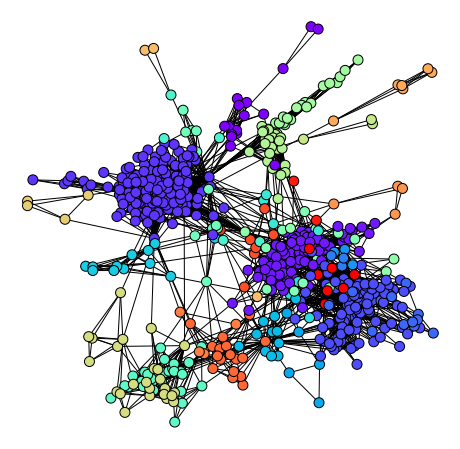

In [743]:
labels = agglomerative_clustering(distance, 0.97)

plt.figure(figsize=(8, 8))

nx.draw_networkx_nodes(

    New_alexey, 

    pos,

    cmap=plt.cm.rainbow,

    node_color=labels, 

    node_size=100, 

    linewidths=1, 

    edgecolors='black'

)

nx.draw_networkx_edges(

    New_alexey,

    pos,

    alpha=1,

    edge_color='black'

)

plt.axis('off')

plt.show()

In [755]:
from sklearn.cluster import KMeans

In [753]:
def norm_laplacian(A):

    A = nx.from_numpy_matrix(A)

    G = nx.linalg.laplacianmatrix.normalized_laplacian_matrix(A)

    degrees = [val for (node, val) in A.degree()]

    return G.toarray(), np.array(degrees)

In [751]:
def spectral_embedding(L, degree_seq, n_components):

    w, v = np.linalg.eigh(L)

    ans = []

    for i in range(v.shape[0]):

        v[i] *= 1/math.sqrt(degree_seq[i])

        ans.append(v[i][1:n_components+1])

    return np.array(ans)

In [750]:
def spectral_clustering(G, n_clusters, n_components):

    A = nx.to_numpy_array(G)

    L, degree_seq = norm_laplacian(A)

    embedding = spectral_embedding(L, degree_seq, n_components)

    kmeans = KMeans(n_clusters=n_clusters)

    kmeans.fit(embedding)

    return kmeans.labels_

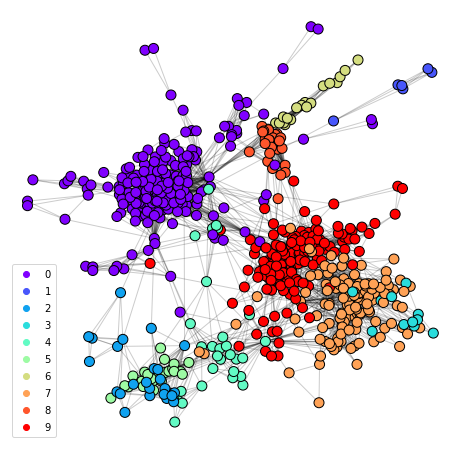

In [762]:
plt.figure(figsize=(8, 8))

nodes = nx.draw_networkx_nodes(

    New_alexey, 

    pos,

    cmap=plt.cm.rainbow,

    node_color=spectral_clustering(New_alexey, 10, 8), 

    node_size=100, 

    linewidths=1, 

    edgecolors='black'

)

nx.draw_networkx_edges(

    New_alexey,

    pos,

    alpha=0.2,

    edge_color='black'

)

plt.axis('off')

plt.legend(*nodes.legend_elements())

plt.show()

В целом этот алгоритм также нашел следующие кластеры:
Фриланс - фиолетовым, саморазвитие - оранжевым, ВШЭ - красным.
Школа - зеленым, Гуу- синим.
Лицей - оранжевым.
Мирэа - темно-зеленым.
Спорт - салатовым.

K-cores

In [745]:
def k_core_decompose(G):


    return np.array(list(nx.core_number(G).values()))


In [746]:
labels = k_core_decompose(New_alexey)

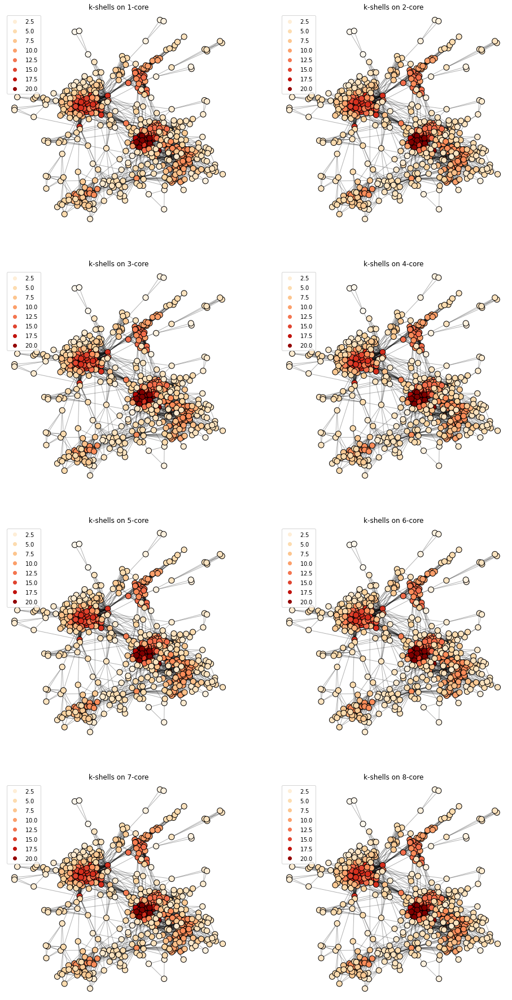

In [748]:
plt.figure(figsize=(8*2, 8*4))



x_max, y_max = np.array(list(pos.values())).max(axis=0)

x_min, y_min = np.array(list(pos.values())).min(axis=0)



for i in range(8):

    plt.subplot(4, 2, i+1)

    subG = nx.k_core(G, i+1)

    nodes = nx.draw_networkx_nodes(

        New_alexey, 

        pos,

        cmap=plt.cm.OrRd,

        node_color=k_core_decompose(New_alexey), 

        node_size=100, 

        edgecolors='black'

    )

    nx.draw_networkx_edges(

        New_alexey, 

        pos,

        alpha=0.3,

        width=1, 

        edge_color='black'

    )

    eps = (x_max - x_min) * 0.05

    plt.xlim(x_min-eps, x_max+eps)

    plt.ylim(y_min-eps, y_max+eps)

    plt.legend(*nodes.legend_elements())

    plt.axis('off')

    plt.title('k-shells on {}-core'.format(i+1))

Assortativity coefficients.

In [926]:
New_alexey['id']

In [927]:
G_alex

In [ ]:
sex = []
fl = 0
for node in New_alexey:
    print(fl)
    fl += 1
    sex.append(vk.users.get(user_id = mass_id_alexey[node],fields = 'sex')[0]['sex'])
    

In [941]:
nx.set_node_attributes(New_alexey, sex, "sex")

In [953]:
for node in New_alexey:
    New_alexey.nodes[node]['sex'] = sex[node]

In [943]:
sex_test=nx.get_node_attributes(New_alexey,'sex')

In [960]:
nx.numeric_assortativity_coefficient(New_alexey, "sex")

0.10816342773832963

In [959]:
nx.attribute_assortativity_coefficient(New_alexey, "sex")

0.10816342773833172

In [ ]:
city = []
fl = 0
for node in New_alexey:
    print(fl)
    fl += 1
    try:
        city.append(vk.users.get(user_id = mass_id_alexey[node],fields = 'city')[0]['city']['id'])
    except Exception:
        city.append(0)

In [971]:
nx.set_node_attributes(New_alexey, city, "city")
for node in New_alexey:
    New_alexey.nodes[node]['city'] = city[node]

In [974]:
nx.attribute_assortativity_coefficient(New_alexey, "city")

0.09222944455388335

In [975]:
nx.degree_assortativity_coefficient(New_alexey)

0.17811288211951928